In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
import warnings, time, gc
from plotly import tools
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode(connected = True)
color = sns.color_palette("Set2")
warnings.filterwarnings("ignore")
%matplotlib inline

from kaggle.competitions import twosigmanews

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

env = twosigmanews.make_env()

Loading the data... This could take a minute.
Done!


In [2]:
market_train, news_train = env.get_training_data()

In [3]:
del market_train; gc.collect()

15

### An Overview on News Data

In [4]:
news_train.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
0,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...","{'Z', 'O', 'OIL'}",1438,1,,False,11,275,"{'0857.HK', '0857.F', '0857.DE', 'PTR.N'}",PetroChina Co Ltd,6,0.235702,-1,0.500739,0.419327,0.079934,73,0,0,0,0,0,0,0,3,6,7
1,2007-01-01 07:03:35+00:00,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...","{'PGE', 'PCO', 'G', 'ESN', 'MD', 'PCU', 'DNP',...",4413,1,FEATURE,False,55,907,{'STA.N'},Travelers Companies Inc,8,0.447214,-1,0.600082,0.345853,0.054064,62,1,1,1,1,1,1,1,3,3,3
2,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",2108,2,PRESS DIGEST,False,15,388,"{'WMT.DE', 'WMT.N'}",Wal-Mart Stores Inc,14,0.377964,-1,0.450049,0.295671,0.254280,67,0,0,0,0,0,0,0,5,11,17
3,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,"{'GOOG.O', 'GOOG.OQ', 'GOOGa.DE'}",Google Inc,13,0.149071,-1,0.752917,0.162715,0.084368,83,0,0,0,0,0,0,0,5,13,15
4,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,{'XMSR.O'},XM Satellite Radio Holdings Inc,11,0.149071,-1,0.699274,0.209360,0.091366,102,0,0,0,0,0,0,0,0,0,0


In [5]:
news_train["headline_len"] = news_train["headline"].apply(lambda x: len(x))

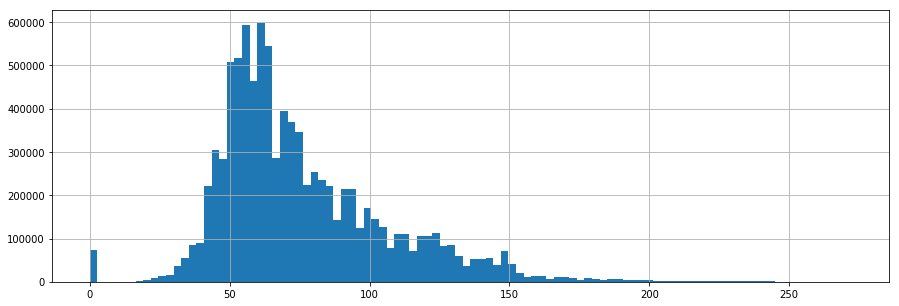

In [6]:
news_train["headline_len"].hist(figsize = (15, 5), bins = 100)
plt.show()

In [7]:
max_len = max(news_train["headline_len"])
temp = news_train[news_train["headline_len"] == max_len]["headline"]
for t in temp:
    print(t)
    print()

PRESS RELEASE - CHICAGO-BASED \\"JAM THEATRICALS\\", PRODUCERS OF BROADWAY SMASH HITS \\"AUGUST: OSAGE COUNTY,\\" \\"THE ADDAMS FAMILY,\\" \\"HAIR\\" AND \\"MONTY PYTHON'S SPAMALOT\\", PARTNERS WITH ENTREPRENEUR JOHN YONOVER TO INSPIRE NEW GENERATION OF BROADWAY INVESTORS

PRESS RELEASE - CHICAGO-BASED \\"JAM THEATRICALS,\\" PRODUCERS OF BROADWAY SMASH HITS \\"AUGUST: OSAGE COUNTY,\\" \\"THE ADDAMS FAMILY,\\" \\"HAIR\\" AND \\"MONTY PYTHON'S SPAMALOT,\\" PARTNERS WITH ENTREPRENEUR JOHN YONOVER TO INSPIRE NEW GENERATION OF BROADWAY INVESTORS



In [8]:
temp = news_train[news_train["headline_len"] == 0]
temp.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D,headline_len
934,2007-01-03 05:49:40+00:00,2007-01-03 05:49:40+00:00,2007-01-03 05:39:36+00:00,397377315a3d1594,,3,1,RTRS,"{'DRU', 'US', 'RTRS', 'RCH', 'LEN'}","{'E', 'PSC', 'U'}",260,1,,False,4,61,{'STJ.N'},St Jude Medical Inc,0,0.707107,0,0.011225,0.786875,0.2019,61,0,0,0,0,0,2,2,2,2,2,0
939,2007-01-03 06:07:15+00:00,2007-01-03 06:07:15+00:00,2007-01-03 05:54:13+00:00,e72b689b155a3400,,3,1,RTRS,"{'MAC', 'US', 'RTRS', 'RCH', 'LEN'}","{'E', 'PSC', 'U'}",260,1,,False,4,61,{'TEX.N'},Terex Corp,0,0.707107,0,0.011225,0.786875,0.2019,61,0,0,0,0,0,2,2,2,2,2,0
940,2007-01-03 06:07:47+00:00,2007-01-03 06:07:47+00:00,2007-01-03 05:54:21+00:00,8b1d2eab91a2ab39,,3,1,RTRS,"{'WWW', 'US', 'RTRS', 'RCH', 'LEN'}","{'E', 'PSC', 'U'}",260,1,,False,4,61,"{'AMZN.O', 'AMZN.DE', 'AMZN.OQ', 'AMZN.F'}",Amazon.com Inc,0,0.707107,0,0.011225,0.786875,0.2019,61,0,0,0,0,0,2,2,2,2,4,0
941,2007-01-03 06:08:06+00:00,2007-01-03 06:08:06+00:00,2007-01-03 05:55:35+00:00,d1c4c1ce869cbcf5,,3,1,RTRS,"{'FUND', 'INS', 'US', 'RTRS', 'RCH', 'LEN'}","{'E', 'PSC', 'U'}",260,1,,False,4,61,{'MMC.N'},Marsh & McLennan Companies Inc,0,0.707107,0,0.011225,0.786875,0.2019,61,0,0,0,0,0,3,4,4,22,24,0
966,2007-01-03 06:51:44+00:00,2007-01-03 06:51:44+00:00,2007-01-03 06:27:47+00:00,b6270e94a3f4e391,,3,1,RTRS,"{'FIN', 'US', 'RTRS', 'RCH', 'LEN'}","{'E', 'PSC', 'U'}",260,1,,False,4,61,{'NMX.N'},Nymex Holdings Inc,0,0.707107,0,0.011225,0.786875,0.2019,61,0,0,0,0,0,2,3,3,5,9,0


In [9]:
# Drop rows with empty headlines
news_train.drop(news_train[news_train["headline_len"] == 0].index, 
                inplace = True)
news_train.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D,headline_len
0,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...","{'Z', 'O', 'OIL'}",1438,1,,False,11,275,"{'0857.HK', '0857.F', '0857.DE', 'PTR.N'}",PetroChina Co Ltd,6,0.235702,-1,0.500739,0.419327,0.079934,73,0,0,0,0,0,0,0,3,6,7,50
1,2007-01-01 07:03:35+00:00,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...","{'PGE', 'PCO', 'G', 'ESN', 'MD', 'PCU', 'DNP',...",4413,1,FEATURE,False,55,907,{'STA.N'},Travelers Companies Inc,8,0.447214,-1,0.600082,0.345853,0.054064,62,1,1,1,1,1,1,1,3,3,3,41
2,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",2108,2,PRESS DIGEST,False,15,388,"{'WMT.DE', 'WMT.N'}",Wal-Mart Stores Inc,14,0.377964,-1,0.450049,0.295671,0.254280,67,0,0,0,0,0,0,0,5,11,17,42
3,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,"{'GOOG.O', 'GOOG.OQ', 'GOOGa.DE'}",Google Inc,13,0.149071,-1,0.752917,0.162715,0.084368,83,0,0,0,0,0,0,0,5,13,15,37
4,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,{'XMSR.O'},XM Satellite Radio Holdings Inc,11,0.149071,-1,0.699274,0.209360,0.091366,102,0,0,0,0,0,0,0,0,0,0,37


In [17]:
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

from nltk.tokenize import word_tokenize, sent_tokenize, TweetTokenizer 
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
from string import punctuation

import re
from functools import reduce

stop_words = set(stopwords.words("english"))

In [18]:
#from:https://github.com/RenatoBMLR/nlpPy/tree/master/src
class TextDataset():
    def __init__(self, df, lang = 'english'):
        self.data = df
        self.tokenizer = TweetTokenizer()
        self.stop_words = set(stopwords.words(lang))
        self.lemmatizer = WordNetLemmatizer()
        self.ps = PorterStemmer()
        
    def _get_tokens(self, words):    
        return [word.lower() for word in words.split()]
    
    def _removeStopwords(self, words):
        # Removing all the stopwords
        return [word for word in words if word not in self.stop_words]

    def _removePonctuation(self, words):
        return re.sub(r'[^\w\s]', '', words)

    def _lemmatizing(self, words):
        #Lemmatizing
        return [self.lemmatizer.lemmatize(word) for word in words]

    def _stemming(self, words):
        #Stemming
        return [self.ps.stem(word) for word in words]

    def process_data(self, col = 'content', remove_pontuation=True, remove_stopw = True, lemmalize = False, stem = False):
        self.data = self.data.drop_duplicates(subset=col, keep="last")
        proc_col = col
        if remove_pontuation:
            proc_col = col + '_data'
            self.data[proc_col] = self.data[col].apply(lambda x: self._removePonctuation(x))
        # get tokens of the sentence
        self.data[proc_col] = self.data[proc_col].apply(lambda x: self._get_tokens(x))
        if remove_stopw:
            self.data[proc_col] = self.data[proc_col].apply(lambda x: self._removeStopwords(x)) 
        if lemmalize:
            self.data[proc_col] = self.data[proc_col].apply(lambda x: self._lemmatizing(x) )
        if stem:
            self.data[proc_col] = self.data[proc_col].apply(lambda x: self._stemming(x))

        self.data['nb_words'] = self.data[proc_col].apply(lambda x: len(x))
        self.proc_col = proc_col
        
    def __len__(self):
        return len(self.data)

We analysize to news of the December of  2016

In [19]:
partial_news = news_train[news_train["time"] >= "2016-12-01"]

In [20]:
text_tokens = TextDataset(partial_news)

In [21]:
text_tokens.process_data(col = "headline")

In [22]:
text_tokens.data["headline_data"].head()

9276842    [gsk, biotech, asthma, drug, wins, uk, approva...
9276845    [blackstone, pursue, ipo, route, home, leasing...
9276847    [invitation, homes, filed, confidentially, ipo...
9276849     [allegion, declares, quarterly, dividend, allen]
9276850    [briefblackstone, pursue, ipo, route, home, le...
Name: headline_data, dtype: object

In [23]:
partial_news["tokens"] = text_tokens.data["headline_data"]

In [24]:
partial_news.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D,headline_len,tokens
9276842,2016-12-01 00:01:00+00:00,2016-12-01 00:01:00+00:00,2016-12-01 00:01:00+00:00,5b3656dcf9480447,GSK biotech asthma drug wins UK approval after...,3,1,RTRS,"{'HECA', 'HEA', 'RTRS', 'MEVN', 'EMRG', 'REGS'...","{'UKI', 'PCO', 'DNP', 'PSC', 'RNP', 'EMK', 'E'}",1484,2,,False,10,265,"{'GSK.L', 'GSK.F', 'GSK.DE', 'GSKy.DE', 'GSK.N'}",GlaxoSmithKline PLC,1,1.0,-1,0.661780,0.120388,0.217832,211,0,0,0,0,0,1,3,4,4,12,63,"[gsk, biotech, asthma, drug, wins, uk, approva..."
9276843,2016-12-01 00:04:30+00:00,2016-12-01 00:04:30+00:00,2016-12-01 00:04:30+00:00,9e3da408f84af714,Transaction in own shares <0005.HK>,3,1,HIIS,"{'STX', 'HIIS', 'ASIA', 'HK', 'CN', 'EQTY', 'E...",{'SHKI'},25,1,,False,2,9,"{'HSBA.DE', 'HSBA.F', 'HSBC.N', 'HBC.PA', 'HSB...",HSBC Holdings PLC,0,1.0,0,0.032095,0.925697,0.042207,9,0,0,0,0,0,9,36,68,68,90,35,NaN
9276844,2016-12-01 00:05:14+00:00,2016-12-01 00:05:14+00:00,2016-12-01 00:05:14+00:00,d03b2798fd839b03,Transaction in own shares(with URL) <0005.HK>,3,1,HIIS,"{'STX', 'HIIS', 'ASIA', 'HK', 'CN', 'EQTY', 'E...",{'SHKI'},554,1,,False,5,79,"{'HSBA.DE', 'HSBA.F', 'HSBC.N', 'HBC.PA', 'HSB...",HSBC Holdings PLC,0,1.0,-1,0.562111,0.280886,0.157002,79,0,0,0,0,0,10,37,69,69,91,45,NaN
9276845,2016-12-01 00:07:10+00:00,2016-12-01 00:07:10+00:00,2016-12-01 00:07:10+00:00,15add5135c3b64bc,BLACKSTONE TO PURSUE IPO ROUTE FOR HOME LEASIN...,1,1,RTRS,"{'FUND', 'REAL', 'BACT', 'PVE', 'IPO', 'REOP',...","{'E', 'U'}",0,1,,False,1,17,{'BX.N'},Blackstone Group LP,1,1.0,-1,0.546699,0.289658,0.163643,17,0,0,0,0,0,1,1,6,6,6,89,"[blackstone, pursue, ipo, route, home, leasing..."
9276846,2016-12-01 00:08:30+00:00,2016-12-01 00:08:30+00:00,2016-12-01 00:08:30+00:00,b1864ee684dd3c8b,Voting Rights and Capital <0005.HK>,3,1,HIIS,"{'STX', 'HIIS', 'ASIA', 'HK', 'CN', 'EQTY', 'E...",{'SHKI'},25,1,,False,2,9,"{'HSBA.DE', 'HSBA.F', 'HSBC.N', 'HBC.PA', 'HSB...",HSBC Holdings PLC,0,1.0,0,0.107648,0.619165,0.273188,9,0,0,0,0,0,11,38,68,70,90,35,NaN


In [25]:
partial_news.fillna(method = "bfill", inplace = True)

## Tf-idf

In [27]:
tf_idf_vec = TfidfVectorizer(min_df = 3, 
                             max_features = 10000, 
                             analyzer = "word",
                             ngram_range = (1, 2),
                             stop_words = "english")

In [28]:
tf_idf = tf_idf_vec.fit_transform(list(partial_news["tokens"].map(lambda tokens: " ".join(tokens))))

In [29]:
tfidf_df = dict(zip(tf_idf_vec.get_feature_names(), tf_idf_vec.idf_))
tfidf_df = pd.DataFrame(columns = ["tfidf"]).from_dict(dict(tfidf_df), orient = "index")
tfidf_df.columns = ["tfidf"]

### Visualize the distribution of the tf-idf scores 

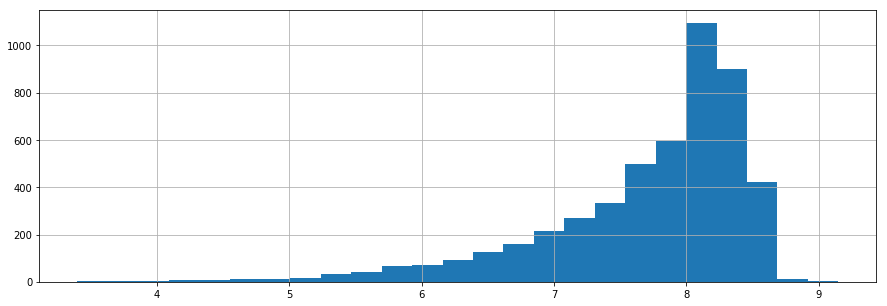

In [30]:
tfidf_df.tfidf.hist(bins = 25, figsize = (15, 5))
plt.show()

Examples of less meaningful words:

In [31]:
tfidf_df.sort_values(by = ["tfidf"], ascending = True).head(10)

,tfidf
announces,3.398955
says,3.477250
shares,3.652029
mln,3.690747
corp,3.750733
pct,3.800821
2017,3.854553
update,3.882371
2016,3.889274
new,4.152886


Examples of more meaningful words:

In [32]:
tfidf_df.sort_values(by=["tfidf"], ascending = False).head(10)

,tfidf
faruqi,9.149197
nok,8.966876
cms,8.912808
hep,8.912808
dkk,8.861515
jbs,8.861515
mv,8.812725
khang,8.812725
optiv,8.766205
cheniere,8.766205


In [33]:
tf_idf.shape

(51908, 5000)

In [34]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components = 30, random_state = 32)
svd_tfidf = svd.fit_transform(tf_idf)

svd_tfidf.shape

(51908, 30)

In [35]:
from sklearn.manifold import TSNE

tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 32, n_iter = 500)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 51908 samples in 0.170s...
[t-SNE] Computed neighbors for 51908 samples in 114.557s...
[t-SNE] Computed conditional probabilities for sample 1000 / 51908
[t-SNE] Computed conditional probabilities for sample 2000 / 51908
[t-SNE] Computed conditional probabilities for sample 3000 / 51908
[t-SNE] Computed conditional probabilities for sample 4000 / 51908
[t-SNE] Computed conditional probabilities for sample 5000 / 51908
[t-SNE] Computed conditional probabilities for sample 6000 / 51908
[t-SNE] Computed conditional probabilities for sample 7000 / 51908
[t-SNE] Computed conditional probabilities for sample 8000 / 51908
[t-SNE] Computed conditional probabilities for sample 9000 / 51908
[t-SNE] Computed conditional probabilities for sample 10000 / 51908
[t-SNE] Computed conditional probabilities for sample 11000 / 51908
[t-SNE] Computed conditional probabilities for sample 12000 / 51908
[t-SNE] Computed conditional probabilities for s

In [36]:
tsne_tfidf.shape

(51908, 2)

We use Bokeh to visualize t-SNE

In [37]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file

In [38]:
tsne_tfidf_df = pd.DataFrame(tsne_tfidf)
tsne_tfidf_df.columns = ["x", "y"]
tsne_tfidf_df["asset_name"] = partial_news["assetName"].values
tsne_tfidf_df["headline"] = partial_news["headline"].values

In [39]:
tsne_tfidf_df.head()

,x,y,asset_name,headline
0,-0.713577,-4.759051,GlaxoSmithKline PLC,GSK biotech asthma drug wins UK approval after...
1,-13.881902,13.159446,HSBC Holdings PLC,Transaction in own shares <0005.HK>
2,-13.884914,13.162118,HSBC Holdings PLC,Transaction in own shares(with URL) <0005.HK>
3,-13.881902,13.159446,Blackstone Group LP,BLACKSTONE TO PURSUE IPO ROUTE FOR HOME LEASIN...
4,-3.713607,-2.271518,HSBC Holdings PLC,Voting Rights and Capital <0005.HK>


In [40]:
output_notebook()
plot_tfidf = bp.figure(plot_width = 700, plot_height = 600, 
                       title = "tf-idf clustering of stock market news",
                       tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                       x_axis_type = None, y_axis_type = None, min_border = 1)

plot_tfidf.scatter(x = "x", y = "y", 
                   source = tsne_tfidf_df,
                   alpha = 0.7)
hover = plot_tfidf.select(dict(type = HoverTool))
hover.tooltips = {"headline": "@headline", "asset_name": "@asset_name"}

show(plot_tfidf)

Loading BokehJS ...

## K-means clustering

In [41]:
from sklearn.cluster import MiniBatchKMeans

kmeans_model = MiniBatchKMeans(n_clusters = 50, # don't have time to find the best number
                               init = "k-means++",
                               n_init =  1,
                               init_size = 1000, 
                               batch_size = 1000, 
                               verbose = 0, 
                               max_iter = 1000)

In [42]:
kmeans = kmeans_model.fit(tf_idf)
kmeans_clusters = kmeans.predict(tf_idf)
kmeans_distances = kmeans.transform(tf_idf)

In [43]:
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 51908 samples in 3.984s...
[t-SNE] Computed neighbors for 51908 samples in 353.226s...
[t-SNE] Computed conditional probabilities for sample 1000 / 51908
[t-SNE] Computed conditional probabilities for sample 2000 / 51908
[t-SNE] Computed conditional probabilities for sample 3000 / 51908
[t-SNE] Computed conditional probabilities for sample 4000 / 51908
[t-SNE] Computed conditional probabilities for sample 5000 / 51908
[t-SNE] Computed conditional probabilities for sample 6000 / 51908
[t-SNE] Computed conditional probabilities for sample 7000 / 51908
[t-SNE] Computed conditional probabilities for sample 8000 / 51908
[t-SNE] Computed conditional probabilities for sample 9000 / 51908
[t-SNE] Computed conditional probabilities for sample 10000 / 51908
[t-SNE] Computed conditional probabilities for sample 11000 / 51908
[t-SNE] Computed conditional probabilities for sample 12000 / 51908
[t-SNE] Computed conditional probabilities for s

In [44]:
tsne_kmeans_df = pd.DataFrame(tsne_kmeans)
tsne_kmeans_df.columns = ["x", "y"]
tsne_kmeans_df["cluster"] = kmeans_clusters
tsne_kmeans_df["asset_name"] = partial_news["assetName"].values
tsne_kmeans_df["headline"] = partial_news["headline"].values

In [45]:
colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5", "#e3be38", 
                     "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
                     "#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", 
                     "#d07d3c", "#52697d", "#194196", "#d27c88", "#36422b", "#b68f79", "#00ffff", "#33ff33",
                     "#ffff99", "#99ff33", "#ff6666", "#666600", "#99004c", "#808080", "#a80a0a", "#a4924c",
                     "#4a8e92", "#92734a", "#7d4097", "#4b4097", "#c0c0c0", "#409794", "#1a709b", "#a7dcf6",
                     "#b1a7f6", "#eea7f6"])

In [46]:
plot_kmeans = bp.figure(plot_width = 700, plot_height = 600, 
                       title = "k-means clustering of stock market news",
                       tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                       x_axis_type = None, y_axis_type = None, min_border = 1)

source = ColumnDataSource(data = dict(x = tsne_kmeans_df["x"], y = tsne_kmeans_df["y"],
                                      color = colormap[kmeans_clusters],
                                      headline = tsne_kmeans_df["headline"],
                                      asset_name = tsne_kmeans_df["asset_name"],
                                      cluster = tsne_kmeans_df["cluster"]))

plot_kmeans.scatter(x = "x", y = "y", color = "color", source = source)
hover = plot_kmeans.select(dict(type = HoverTool))
hover.tooltips = {"headline": "@headline", "asset_name": "@asset_name", "cluster": "@cluster"}
show(plot_kmeans)

### Latent Dirichlet Allocation (LDA)
Unlike k-means clustering, LDA is a soft clustering and is capable to illustrate documents with multible topics

In [47]:
cv = CountVectorizer(min_df = 2,
                     max_features = 100000,
                     analyzer = "word",
                     ngram_range = (1, 2),
                     stop_words = "english")

In [48]:
count_vectors = cv.fit_transform(partial_news["headline"])

In [49]:
lda_model = LatentDirichletAllocation(n_components = 20, 
                                      # we choose a small n_components for time convenient
                                      learning_method = "online",
                                      max_iter = 20,
                                      random_state = 32)

In [50]:
news_topics = lda_model.fit_transform(count_vectors)

In [51]:
n_top_words = 10
topic_summaries = []
topic_word = lda_model.components_
vocab = cv.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(" ".join(topic_words))
    print("Topic {}: {}".format(i, " | ".join(topic_words)))

Topic 0: says | announces | sale | market | brief | boeing | advanced | investigation | storage | digital
Topic 1: announces | update | board | trump | directors | rpt | board directors | chief | officer | investment
Topic 2: partners | healthcare | investors | alert | america | health | firm | update | class | closed
Topic 3: bank | plc | ceo | deutsche | reg | ag | brazil | deutsche bank | form | company
Topic 4: pct | shares | trade | shares pct | premarket | therapeutics | morgan | data | annual | world
Topic 5: research | research roundup | roundup | technology | resources | general | europe | companies | payne celadon | group macerich
Topic 6: mln | agreement | says | group | financial | 2017 | brief | corp | company | international
Topic 7: 30 | management | says | gas | november | equity | 2016 | contract | space | court
Topic 8: stocks | dec | hk | announcement | buzz stocks | national | banks | watch | early | factors
Topic 9: buzz | buzz stocks | senior | notes | issued | li

In [52]:
tsne_lda = tsne_model.fit_transform(news_topics)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 51908 samples in 0.086s...
[t-SNE] Computed neighbors for 51908 samples in 85.944s...
[t-SNE] Computed conditional probabilities for sample 1000 / 51908
[t-SNE] Computed conditional probabilities for sample 2000 / 51908
[t-SNE] Computed conditional probabilities for sample 3000 / 51908
[t-SNE] Computed conditional probabilities for sample 4000 / 51908
[t-SNE] Computed conditional probabilities for sample 5000 / 51908
[t-SNE] Computed conditional probabilities for sample 6000 / 51908
[t-SNE] Computed conditional probabilities for sample 7000 / 51908
[t-SNE] Computed conditional probabilities for sample 8000 / 51908
[t-SNE] Computed conditional probabilities for sample 9000 / 51908
[t-SNE] Computed conditional probabilities for sample 10000 / 51908
[t-SNE] Computed conditional probabilities for sample 11000 / 51908
[t-SNE] Computed conditional probabilities for sample 12000 / 51908
[t-SNE] Computed conditional probabilities for sa

In [53]:
news_topics = np.matrix(news_topics)
doc_topics = news_topics/news_topics.sum(axis = 1)

lda_keys = []
for i, tweet in enumerate(partial_news["headline"]):
    lda_keys += [doc_topics[i].argmax()]
    
tsne_lda_df = pd.DataFrame(tsne_lda, columns = ["x", "y"])
tsne_lda_df["headline"] = partial_news["headline"].values
tsne_lda_df["asset_name"] = partial_news["assetName"].values
tsne_lda_df["topics"] = lda_keys
tsne_lda_df["topics"] = tsne_lda_df["topics"].map(int)

In [54]:
plot_lda = bp.figure(plot_width = 700, plot_height = 600, 
                    title = "LDA topics of stock market news",
                    tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                    x_axis_type = None, y_axis_type = None, min_border = 1)

source = ColumnDataSource(data = dict(x = tsne_lda_df["x"], y = tsne_lda_df["y"],
                         color = colormap[lda_keys],
                         headline = tsne_lda_df["headline"],
                         asset_name = tsne_lda_df["asset_name"],
                         topics = tsne_lda_df["topics"]))

plot_lda.scatter(x = "x", y = "y", color = "color", source = source)
hover = plot_lda.select(dict(type = HoverTool))
hover.tooltips = {"headline": "@headline", "asset_name": "@asset_name", "topics": "@topics"}
show(plot_lda)